# Trabalho Final

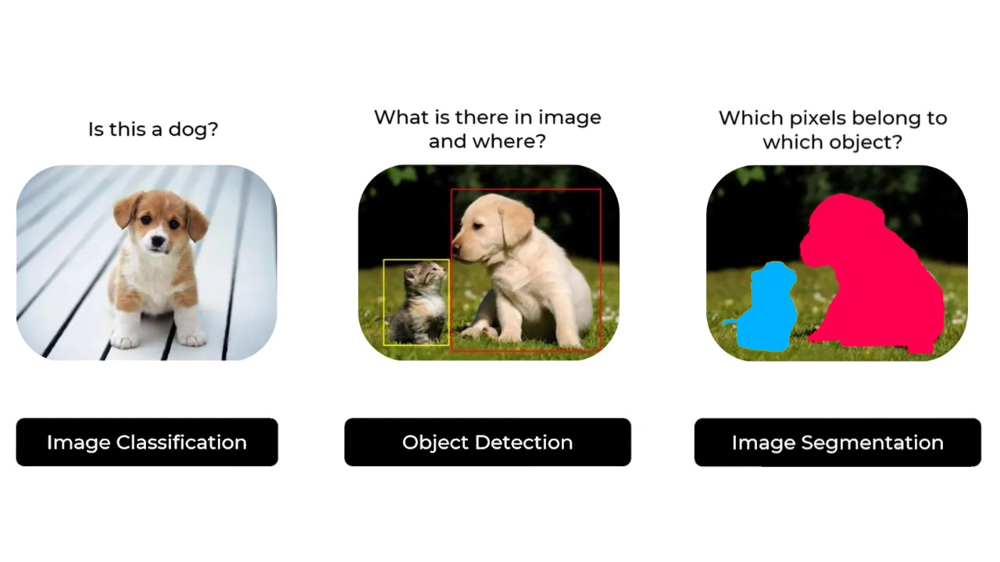

# Tarefa: Prova de conceito com IA

## Nota 5.0

O projeto será focado em criar um aplicativo de prova de conceito (PoC) usando uma rede neural profunda, aqui está um conjunto de expectativas que você pode considerar para a apresentação e a solução:

Conceito e Relevância

- Declaração do Problema: Defina claramente a necessidade de negócios ou problema que o aplicativo aborda.
- Inovação: Explique como o aplicativo introduz uma nova solução ou melhora as existentes.

Implementação Técnica

- Escolha da Tecnologia: Justifique a escolha da rede neural (por exemplo, YOLO, OpenPose) para a tarefa.
- Visão geral da solução: Apresenta uma visão abstrata da solução
- Funcionalidade: Demonstre os recursos centrais da prova de conceito e como ele utiliza a rede neural escolhida para resolver o problema.

Código:

- Apresente o código e as principais dificuldades
- Código deve ser enviado via e-mail ou disponibilizado no canvas

Inovação
- Projetos repetidos entre grupos diferentes serão avaliados negativamente

## Projeto

O objetivo do projeto é utilizar o YOLO para contar quantos carros passaram por determinada rua num vídeo

In [ ]:
!pip install yolov5

In [ ]:
!pip install torch opencv-python numpy matplotlib


# Bibliotecas

In [ ]:
import yolov5
import cv2
import numpy as np
from collections import defaultdict
from IPython.display import clear_output


Primeiramente testamos a identificação numa única imagem, aqui tivemos nossa principal referencia: https://www.youtube.com/watch?v=HrsXi-Nd2GU

Saved 1 image to runs/detect/exp


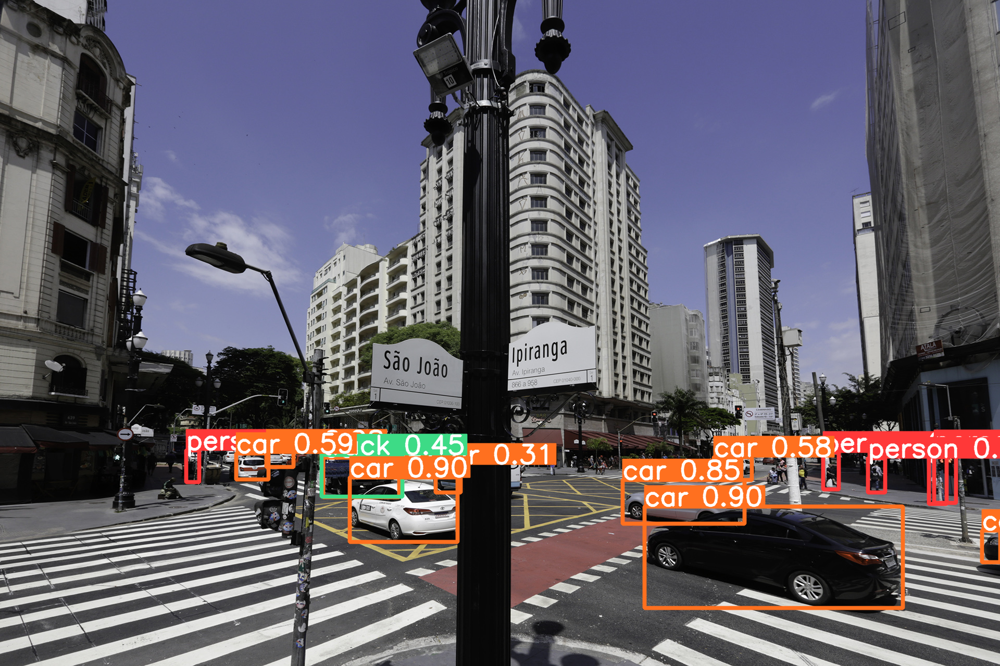

In [ ]:
# Model
model = yolov5.load('yolov5s.pt')

# Image
img = ('img.jpg')  # or file, Path, PIL, OpenCV, numpy, list

results = model(img)

# Results
  #results.show()  # or .show(), .save(), .crop(), .pandas(), etc.

results.save()
results.show()


cont = 0
carros = 0
if (len(results.xyxy[0]) >= 0):
    while(cont < (len(results.xyxy[0]))):
        __,__,__,__,confianca,classe = results.xyxy[0][cont].numpy() #salva valores de % e tipo de objeto
        numeroClasse = int(classe) #pega o número do tipo da classe
        #print("Numero da classe: ",numeroClasse)
        nomeClasse = results.names[int(classe)] #pega o tipo da classe
        print("Nome da classe: "+nomeClasse+" | Confiança: "+str(confianca))
        if nomeClasse == "car":
          carros += 1
        cont += 1
else:
    print("############# Não tem carro! #############")



Com essa detecção, podemos avaliar um vídeo frame a frame

In [ ]:
# Carregar o modelo
model = yolov5.load('yolov5s.pt')

# Verificar se o modelo foi carregado com sucesso
if model is None:
  print("Erro ao carregar o modelo. Verifique se o caminho do modelo está correto.")
  exit()

# Abrir o vídeo
video_path = 'ruav3.mp4'  # caminho para o vídeo
cap = cv2.VideoCapture(video_path)
# Verificar se o vídeo foi aberto com sucesso
if not cap.isOpened():
  print("Erro ao abrir o vídeo. Verifique se o caminho do vídeo está correto.")
  exit()


# Loop para processar o vídeo frame a frame
while True:
  ret, frame = cap.read()  # Lê um frame do vídeo

  if not ret:
    break  # Sai do loop quando não houver mais frames

  # Fazer a inferência no frame
  results = model(frame)


  # Contagem de veiculos
  cont = 0
  veiculos = 0
  if (len(results.xyxy[0]) >= 0):
    while(cont < (len(results.xyxy[0]))):
      __,__,__,__,confianca,classe = results.xyxy[0][cont].numpy() #salva valores de % e tipo de objeto
      numeroClasse = int(classe) #pega o número do tipo da classe
      #print("Numero da classe: ",numeroClasse)
      nomeClasse = results.names[int(classe)] #pega o tipo da classe
      #print("Nome da classe: "+nomeClasse+" | Confiança: "+str(confianca))
      if nomeClasse == 'car' or nomeClasse == 'truck':
        veiculos += 1
      cont += 1
    print(f'{veiculos} veiculos!')
  else:
    print("############# Não tem carro! #############")



# Liberar recursos
cap.release()
cv2.destroyAllWindows()


Por fim, temos a solução final

3 veículos distintos atravessaram a rua!


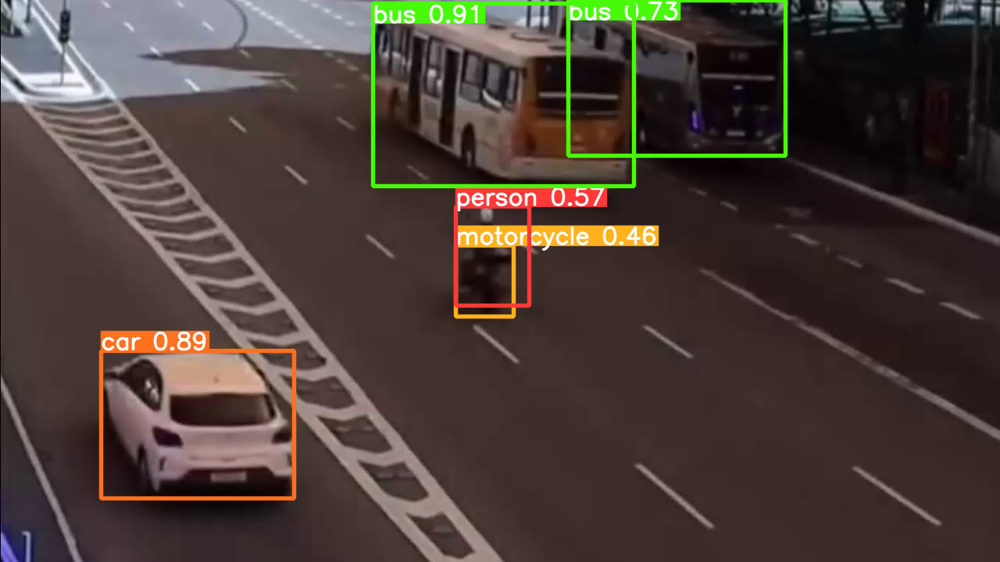

3 veículos distintos atravessaram a rua!


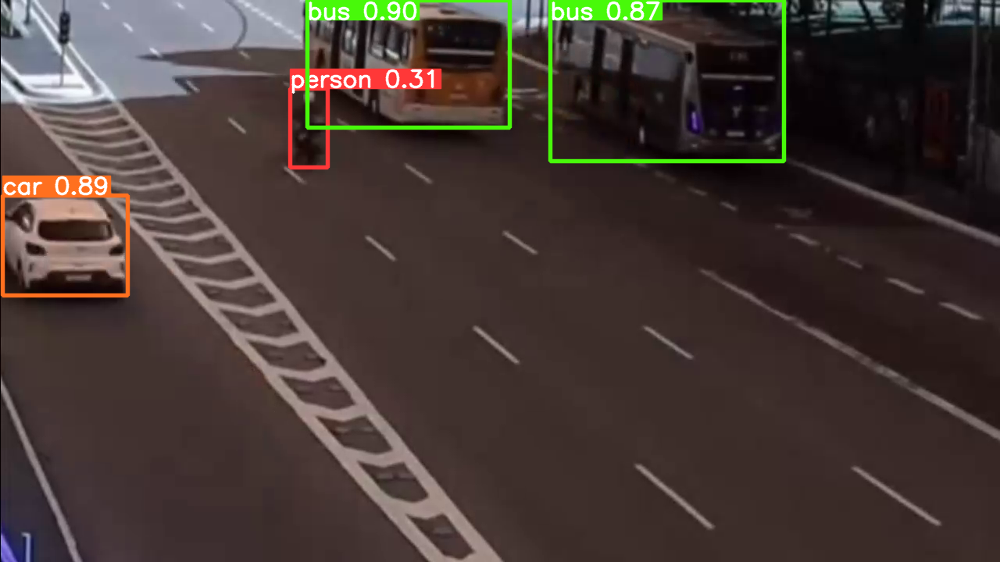

4 veículos distintos atravessaram a rua!


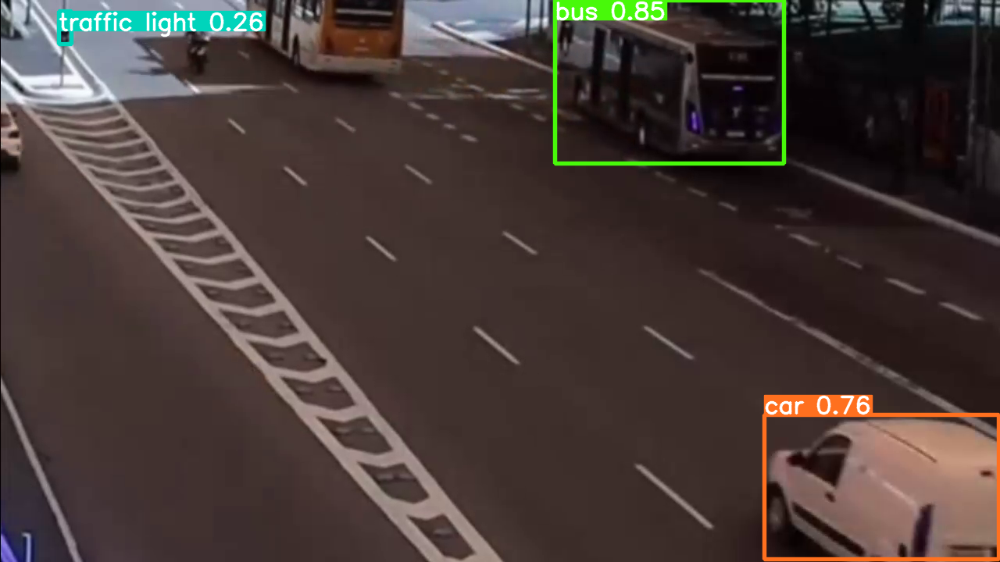

5 veículos distintos atravessaram a rua!


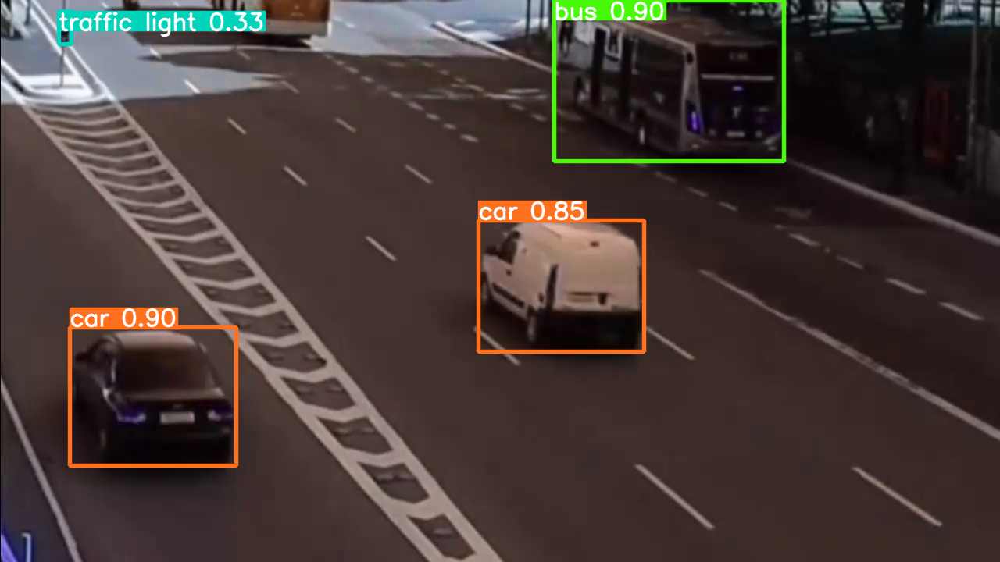

7 veículos distintos atravessaram a rua!


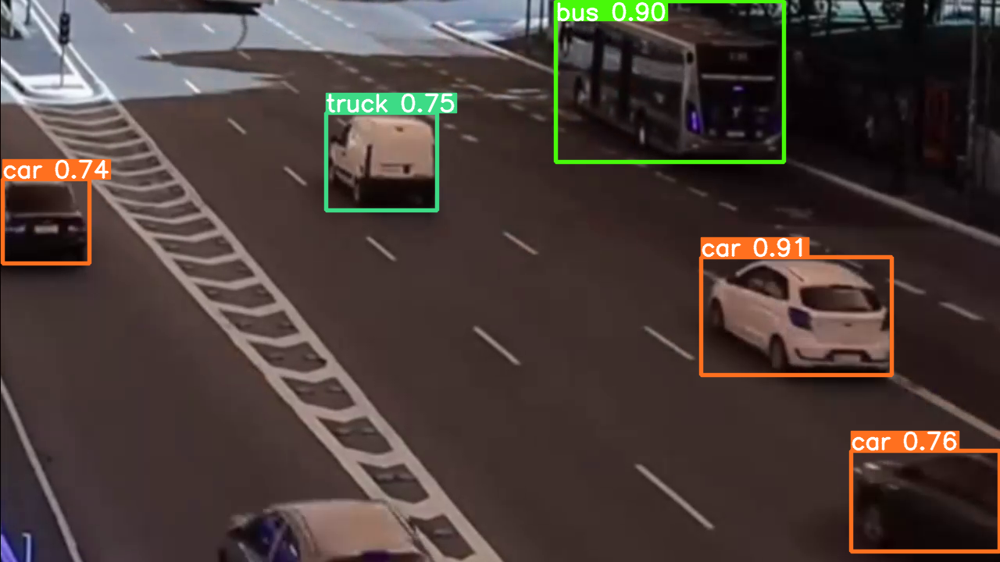

10 veículos distintos atravessaram a rua!


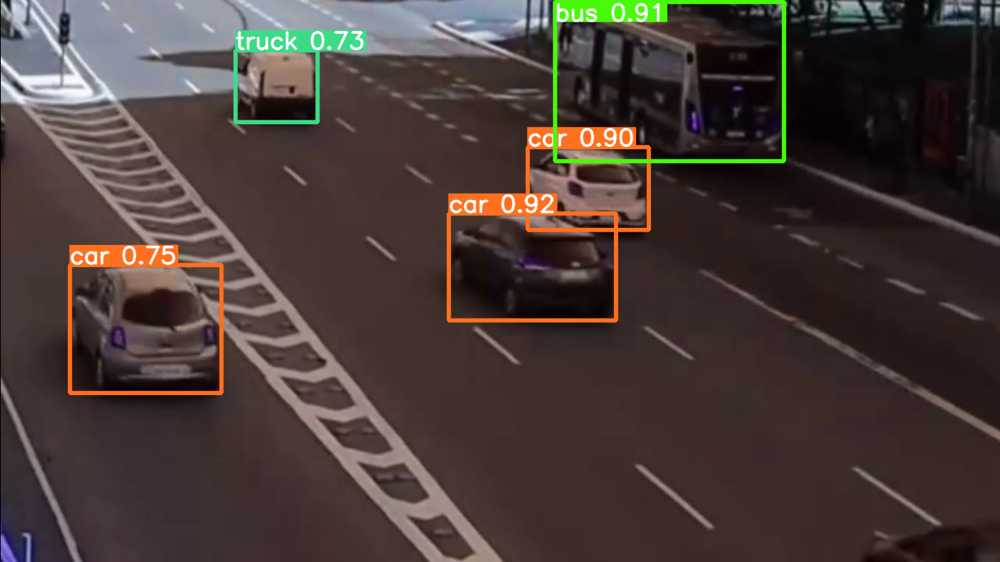

10 veículos distintos atravessaram a rua!


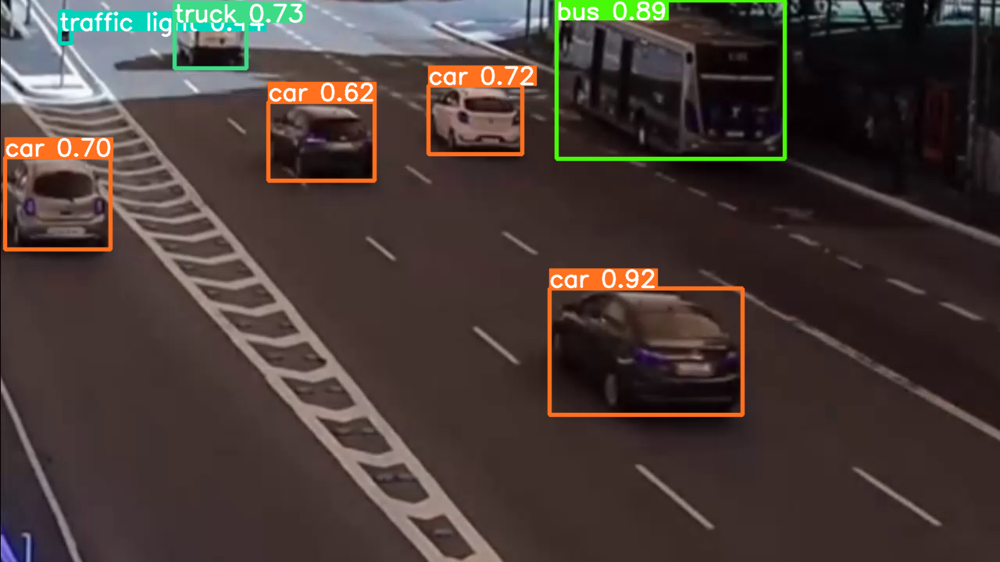

12 veículos distintos atravessaram a rua!


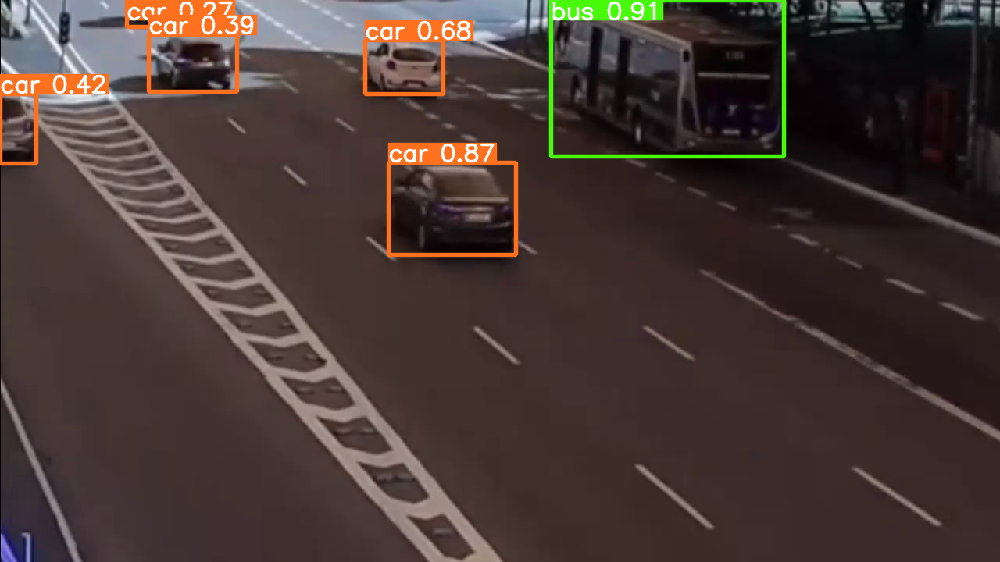

12 veículos distintos atravessaram a rua!


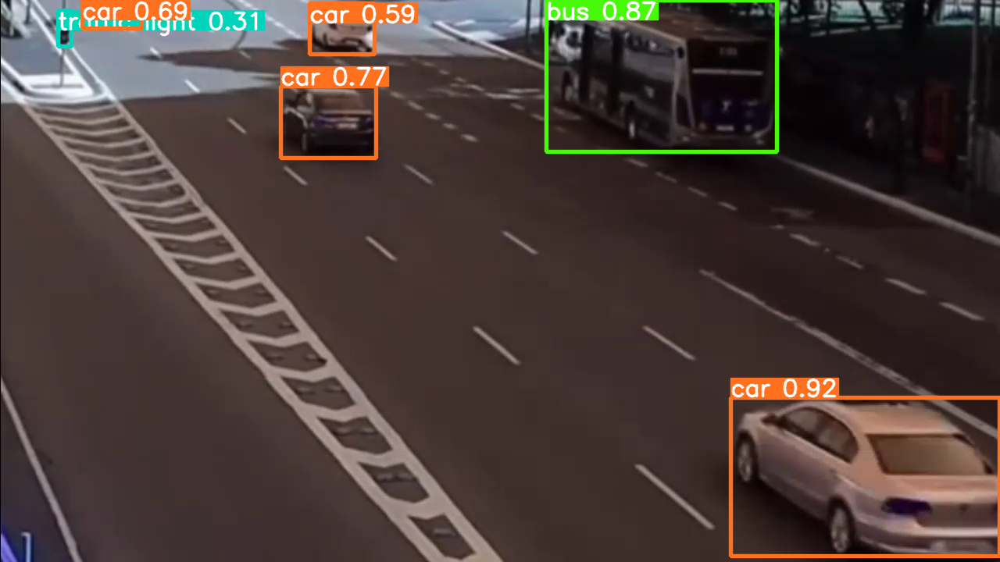

12 veículos distintos atravessaram a rua!


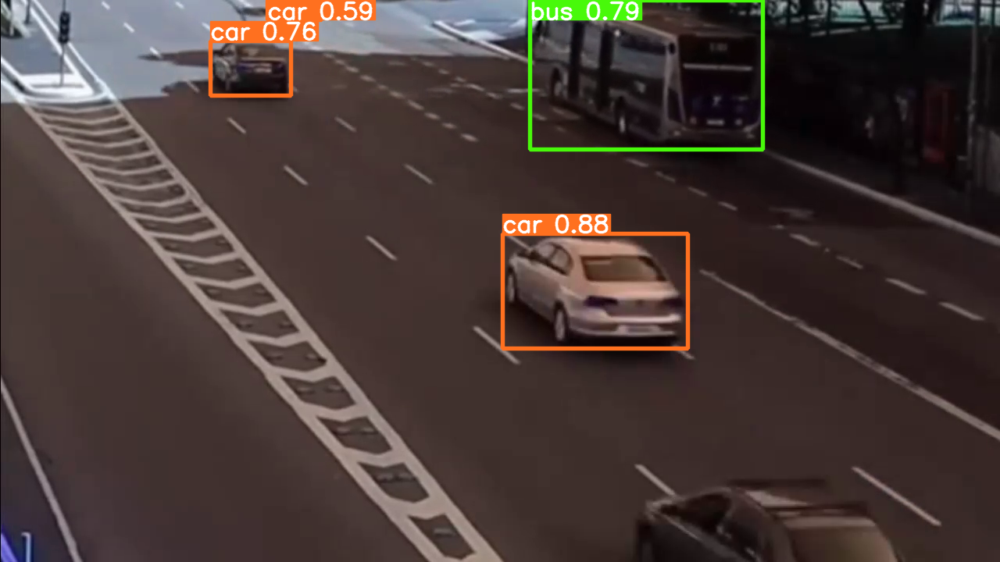

12 veículos distintos atravessaram a rua!


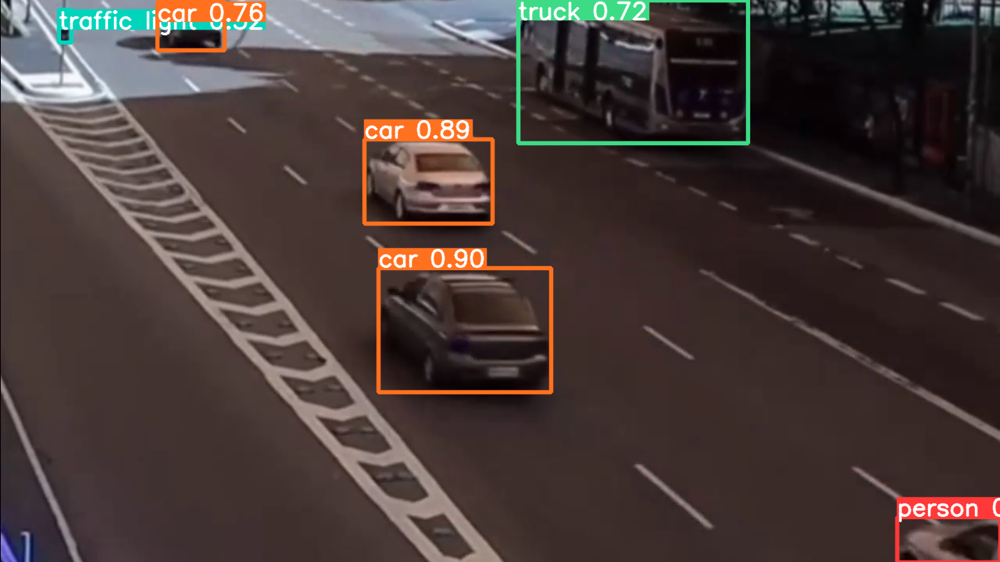

13 veículos distintos atravessaram a rua!


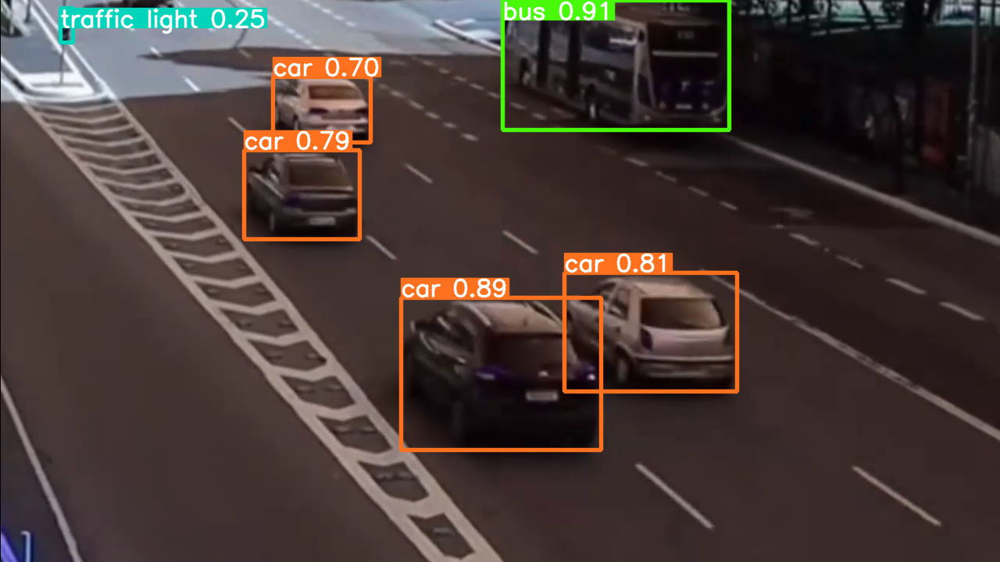

14 veículos distintos atravessaram a rua!


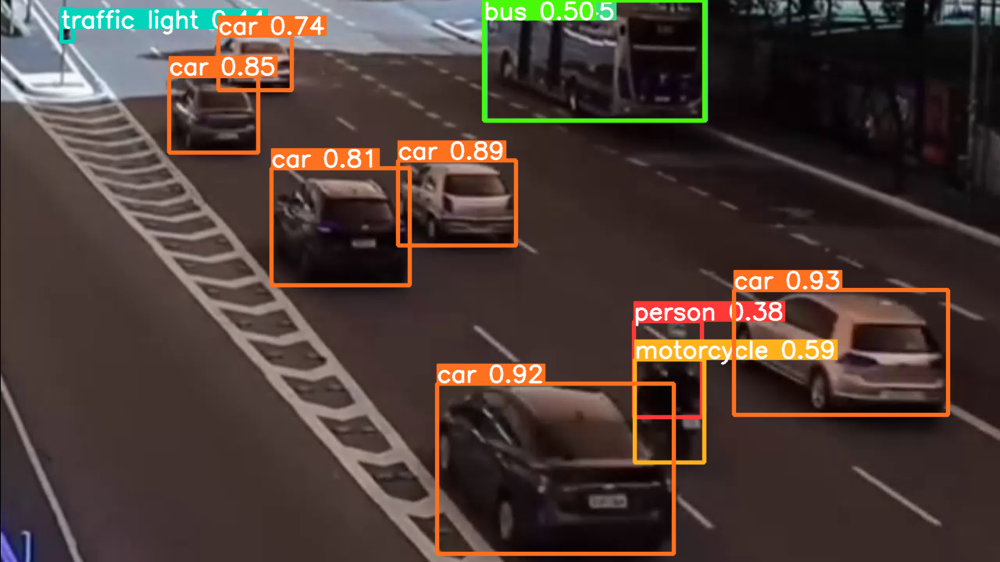

14 veículos distintos atravessaram a rua!


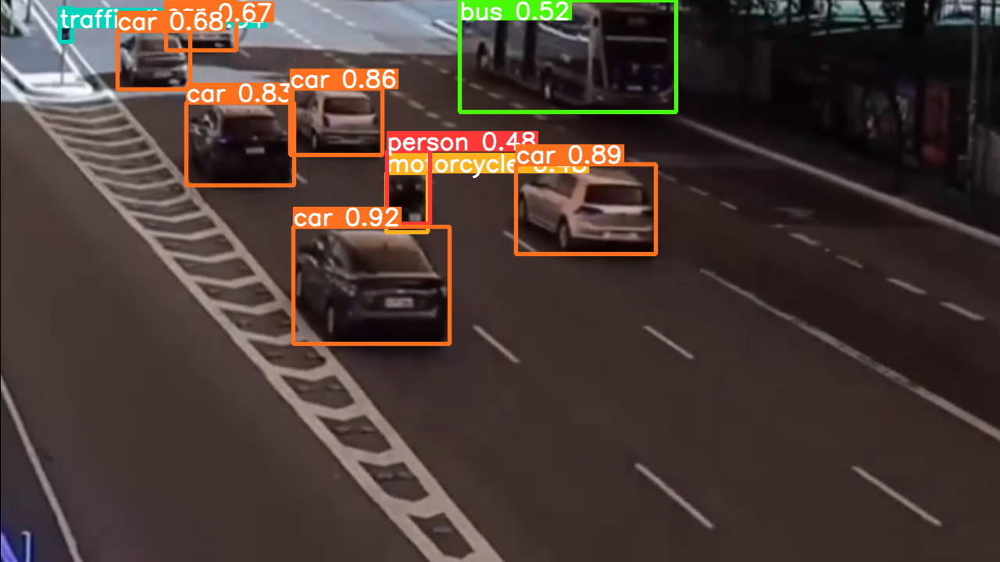

16 veículos distintos atravessaram a rua!


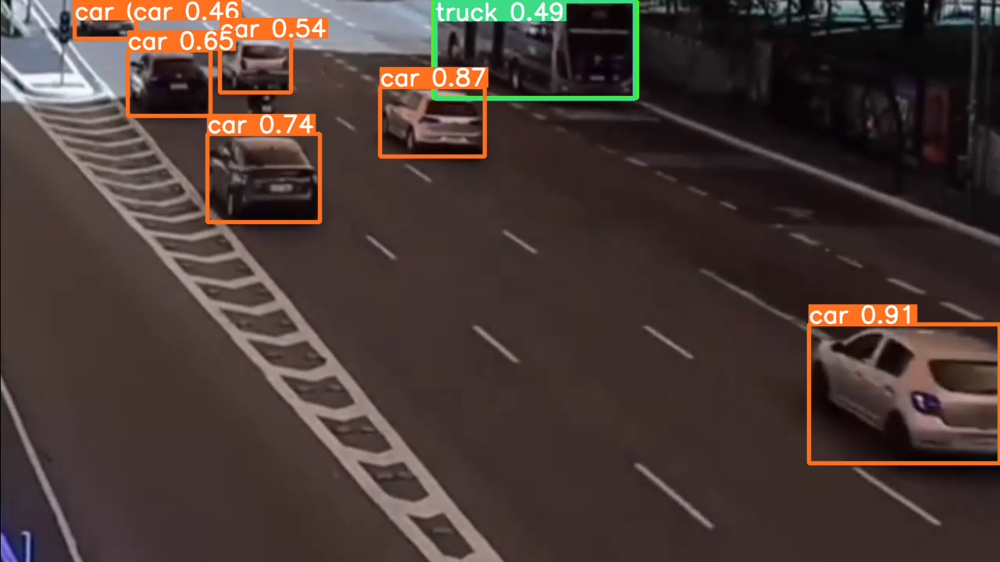

17 veículos distintos atravessaram a rua!


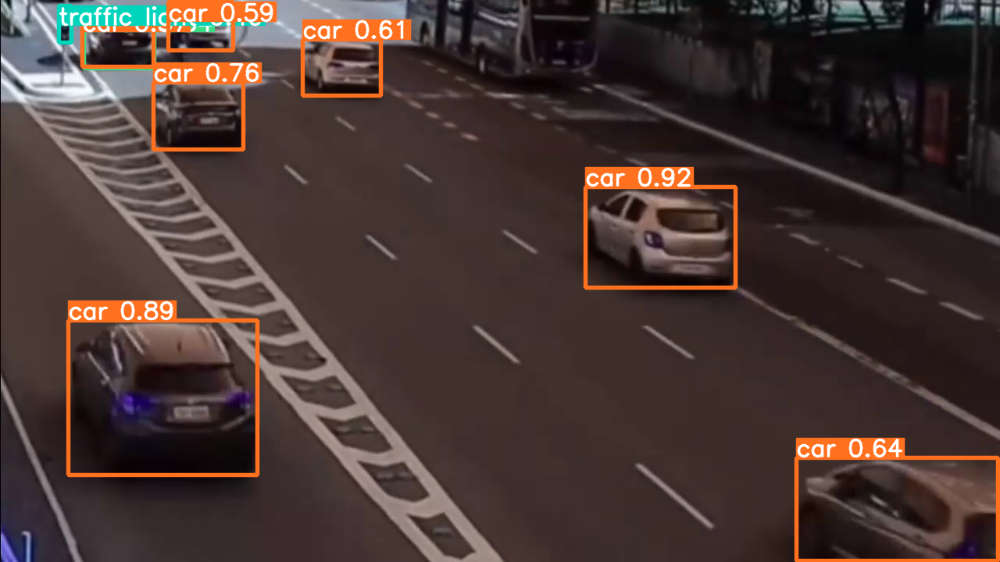

18 veículos distintos atravessaram a rua!


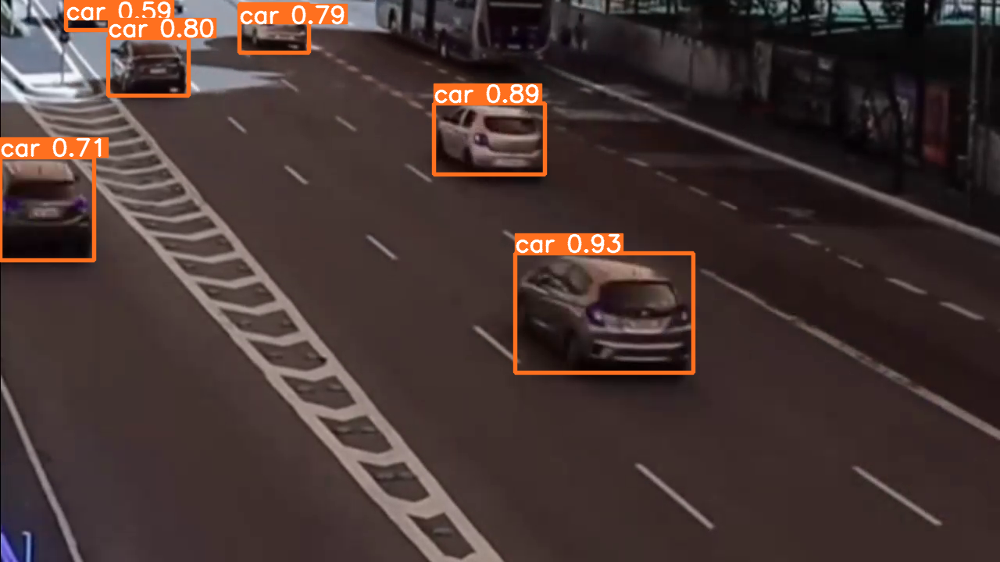

19 veículos distintos atravessaram a rua!


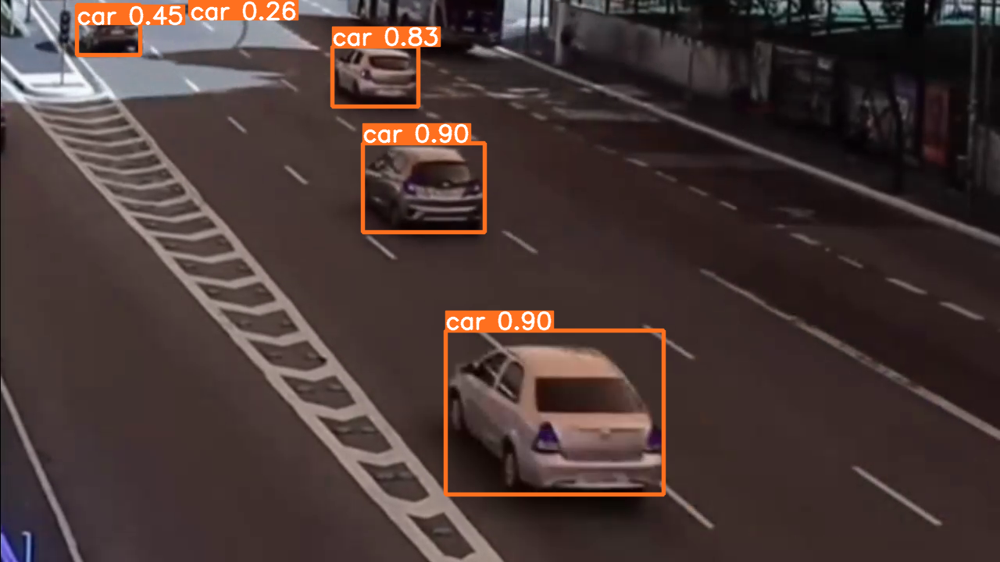

19 veículos distintos atravessaram a rua!


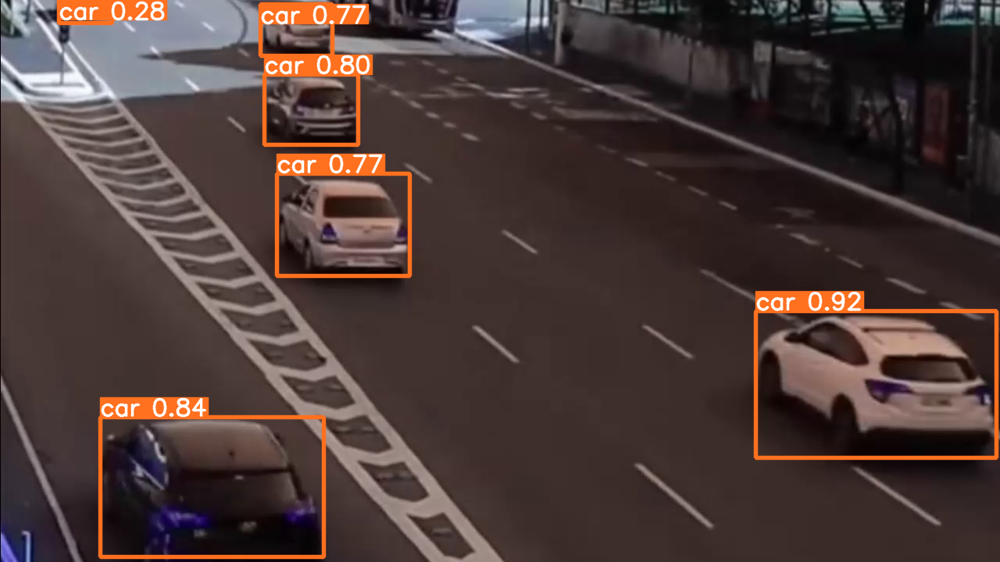

19 veículos distintos atravessaram a rua!


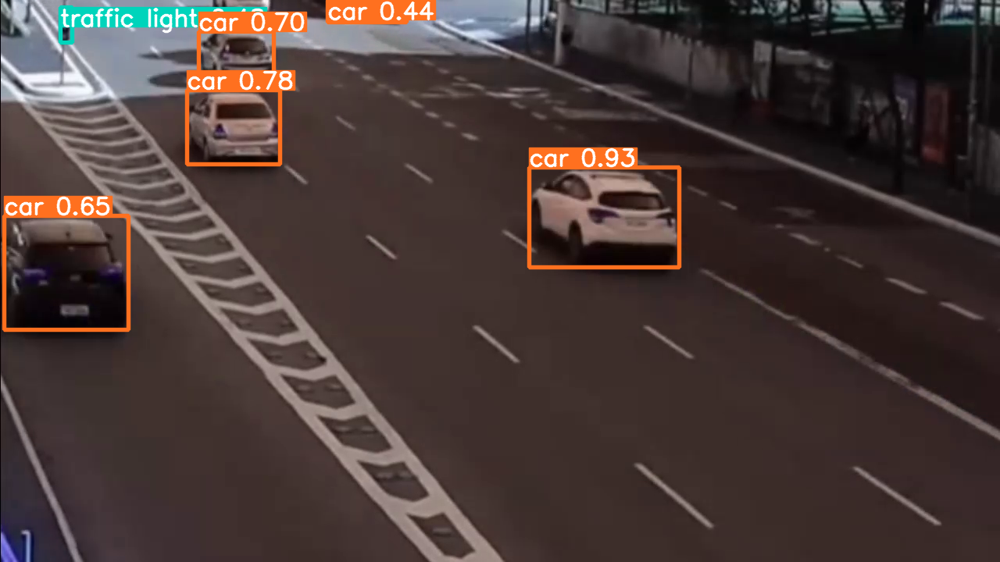

19 veículos distintos atravessaram a rua!


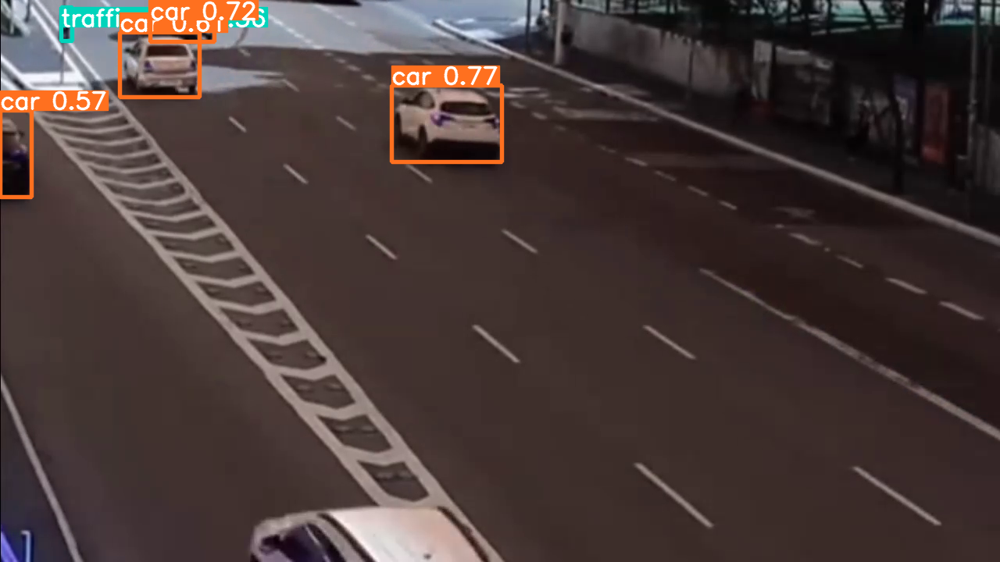

20 veículos distintos atravessaram a rua!


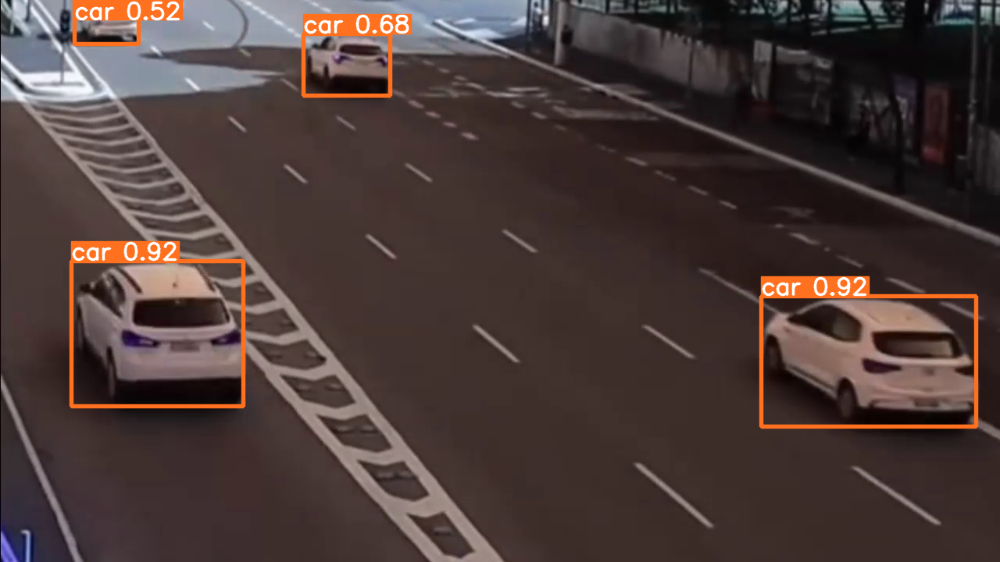

20 veículos distintos atravessaram a rua!


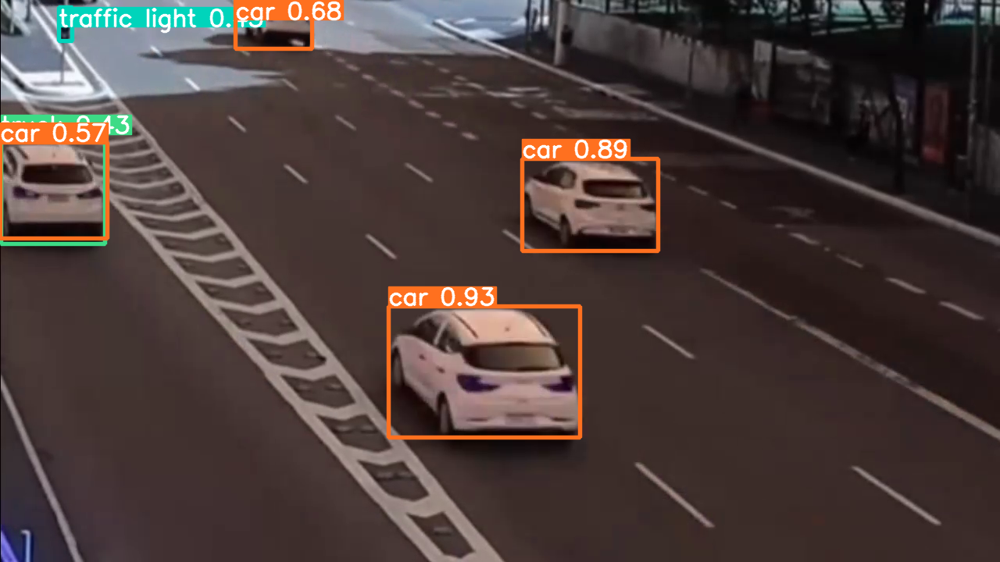

20 veículos distintos atravessaram a rua!


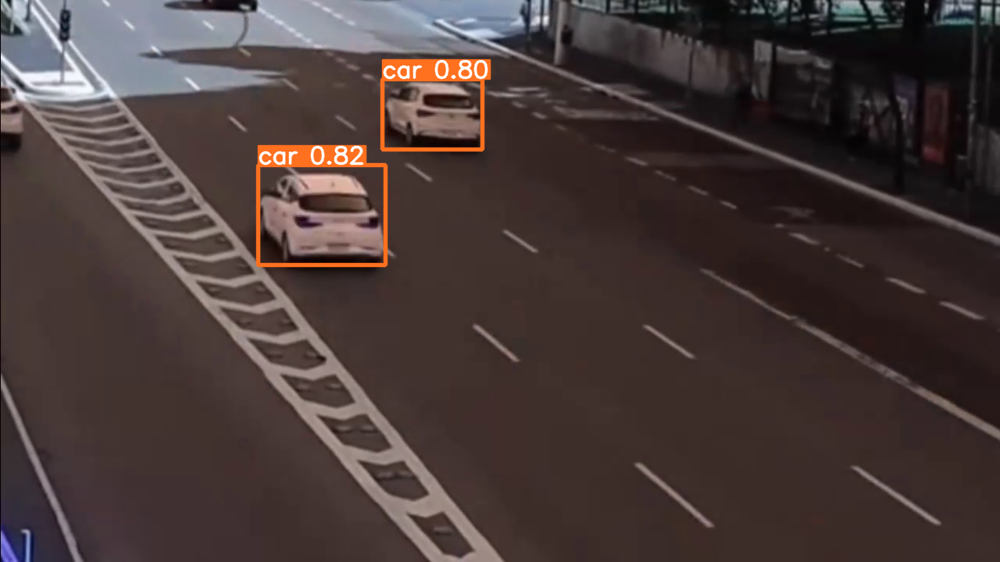

20 veículos distintos atravessaram a rua!


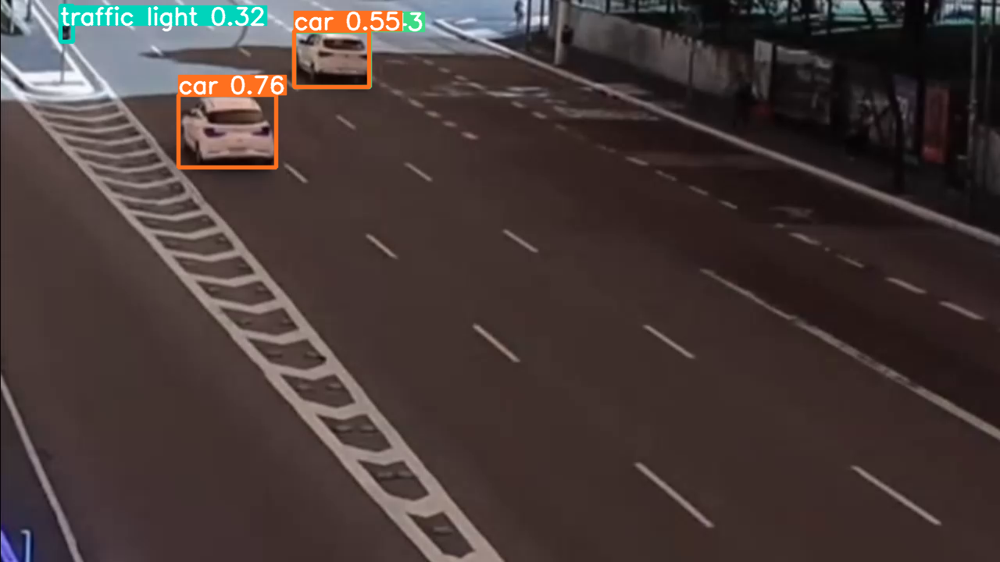

20 veículos distintos atravessaram a rua!


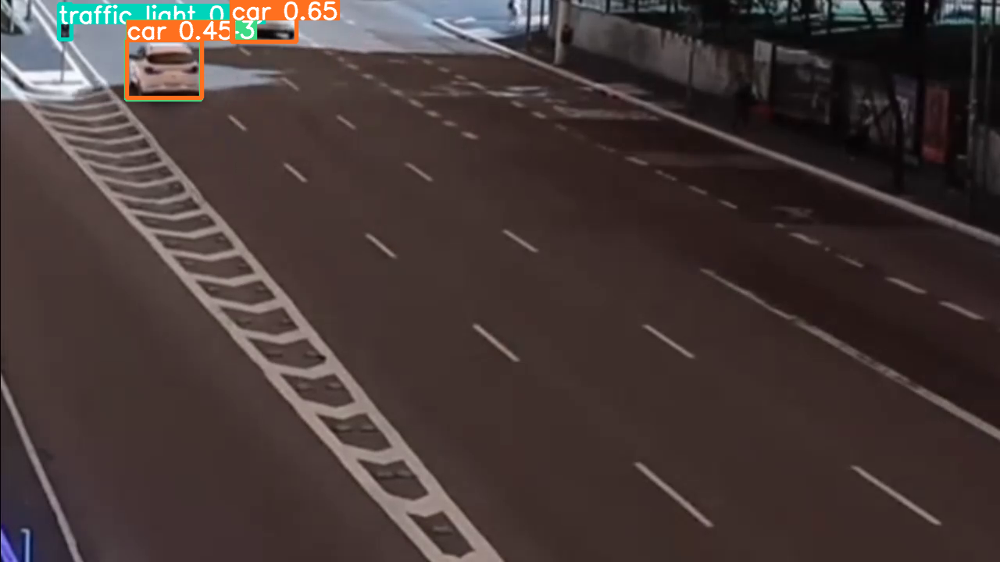

20 veículos distintos atravessaram a rua!


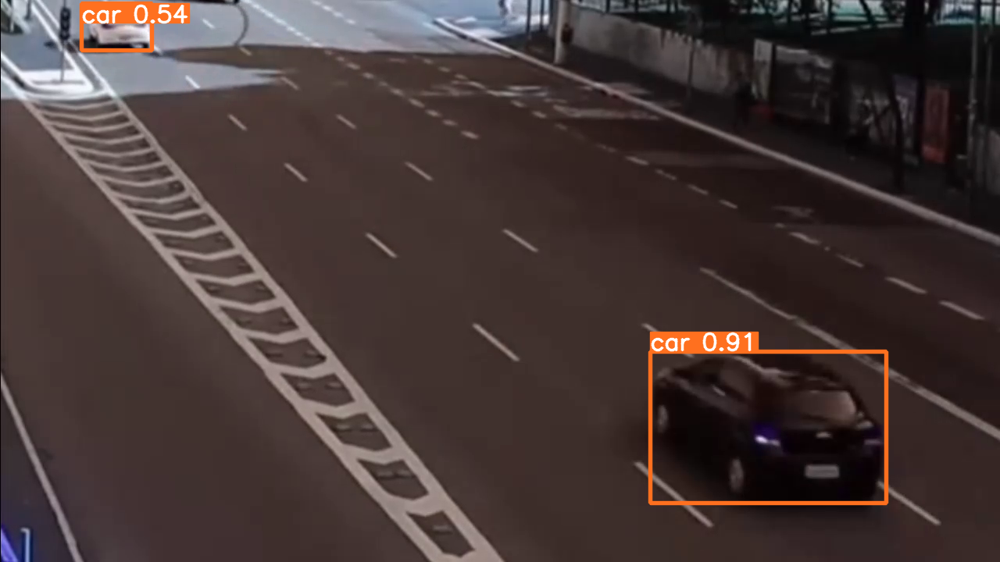

20 veículos distintos atravessaram a rua!


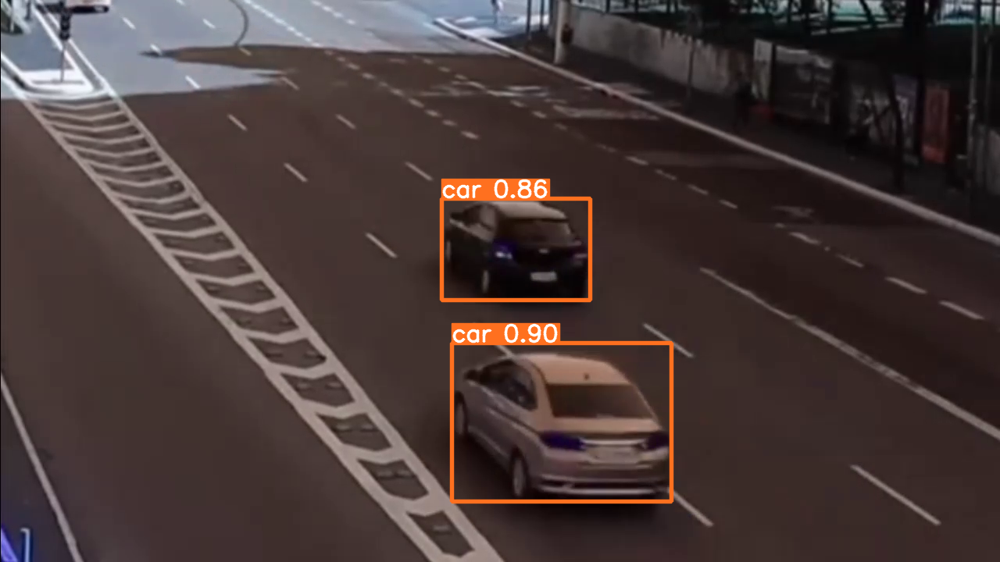

20 veículos distintos atravessaram a rua!


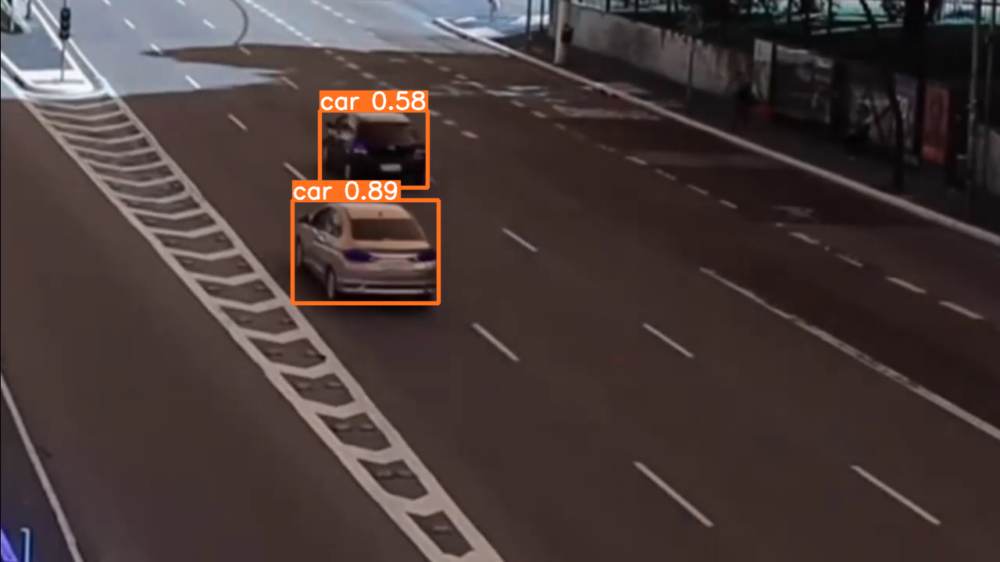

20 veículos distintos atravessaram a rua!


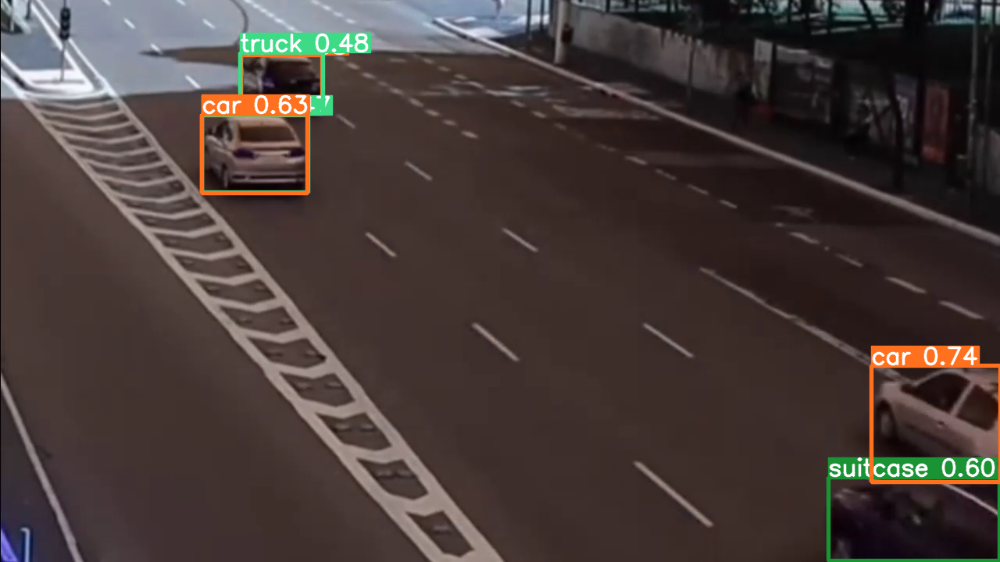

20 veículos distintos atravessaram a rua!


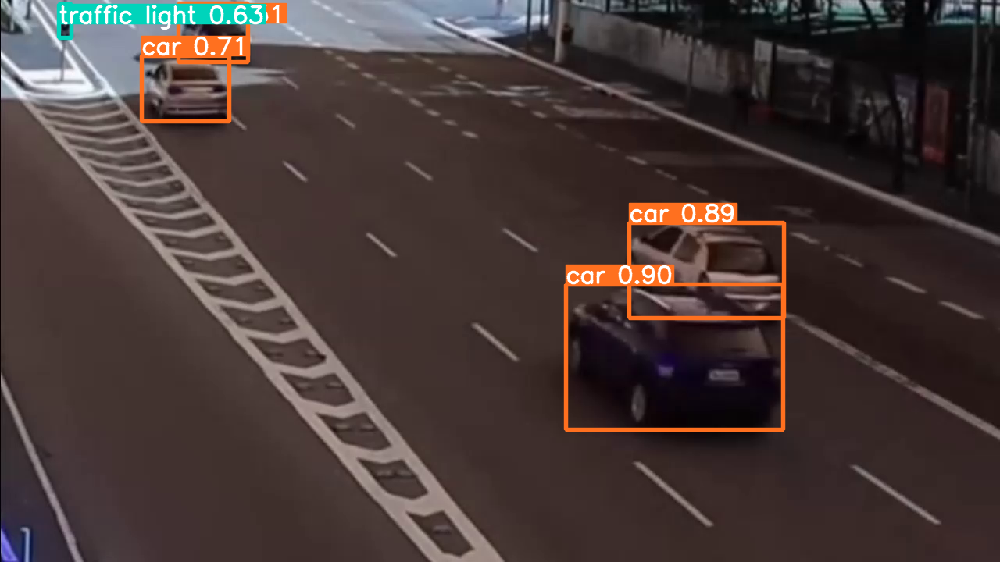

20 veículos distintos atravessaram a rua!


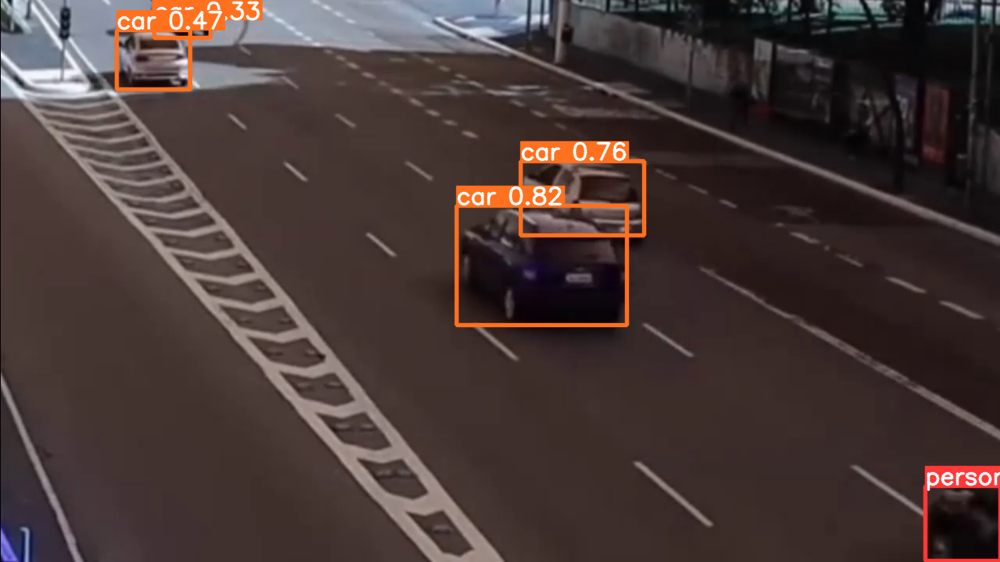

In [ ]:
# Carregar o modelo
model = yolov5.load('yolov5s.pt')

# Abrir o vídeo
video_path = 'ruav3.mp4'  # caminho para o vídeo
cap = cv2.VideoCapture(video_path)

# Dicionário para rastrear os IDs dos veículos e suas últimas posições
vehicle_positions = {}

# Definir a distância mínima para considerar um veículo como novo
min_distance_new_vehicle = 200 # Tentativa e erro com valores arbitrários

aux = 0
# Loop para processar o vídeo frame por frame
while True:
  ret, frame = cap.read()  # Lê um frame do vídeo

  if not ret:
      break  # Sai do loop quando não houver mais frames

  # Fazer a inferência no frame
  results = model(frame)

  # Verificar os veículos identificados
  for detection in results.xyxy[0]:
    _, _, _, _, confidence, class_idx = detection.numpy()
    class_idx = int(class_idx)
    class_name = results.names[class_idx]
    if class_name in ['car','truck','bus','motorcycle']:
      # Calcular o centro do retângulo delimitador
      x_center = (detection[0] + detection[2]) / 2
      y_center = (detection[1] + detection[3]) / 2
      center = np.array([x_center, y_center])

      # Verificar se o veículo é novo ou se já foi detectado anteriormente
      new_vehicle = True
      for vehicle_id, last_position in vehicle_positions.items():
        distance = np.linalg.norm(center - last_position)
        if distance < min_distance_new_vehicle:
          new_vehicle = False
          # Atualizar a posição do veículo no dicionário
          vehicle_positions[vehicle_id] = center
          break

      # Se o veículo for novo, adicioná-lo ao dicionário de posições
      if new_vehicle:
        vehicle_id = len(vehicle_positions) + 1
        vehicle_positions[vehicle_id] = center

  # Contar o número de veículos distintos
  num_vehicles = len(vehicle_positions)

  # Exibição dos frames
  if aux%5==0:
    print(f'{num_vehicles} veículos distintos atravessaram a rua!')
    results.show()
  aux += 1


# Liberar recursos
cap.release()
cv2.destroyAllWindows()
